# A First Introduction to Working with DKIST/VISP Data 

Tom Schad | tschad@nso.edu 

**Description** This notebook provides an in depth dive into working with VISP data.  It utilizes the DKIST User Tools and the Level 1 data.  In addition to data reading, loading, and coordinate frames, the following topics are briefly covered: 

* Optimizing how you work with the data (Dash Arrays vs Load-into-memory vs Memmaps) 
* Determining an improved wavelength axis (Note: wavelength coordinates planned to be improved by Data Center in upcoming recalibration)
* How to align to SDO/HMI
* How to assess the spatial resolution of the data
* How to derive and apply corrections to polarized stokes Stokes.
* Comparison of Stokes data with HMI - the coordinate frame 

**Pre-requisities** This notebook assumes a knowledge of scientific Python-Based analysis tools and some knowledge of DKIST data (especially how to download it).  See, e.g., https://docs.dkist.nso.edu/projects/python-tools/en/stable/ for more information.

In [89]:
import os 
import sys 
import numpy as np
import pandas as pd 
import glob
from tqdm.auto import trange
from IPython.core.display import HTML 
from datetime import datetime, timedelta
from scipy import ndimage

import astropy.units as u
from astropy.coordinates import SkyCoord, EarthLocation
from astropy.time import Time
from astropy.io import fits
from astropy.wcs import WCS

import dkist
import sunpy.map
from sunpy.net import Fido, attrs as a
from sunpy.coordinates import frames

import dask
import dask.array as da
from dask.diagnostics import ProgressBar

### PLOTTING TOOLS
from matplotlib.colors import PowerNorm
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as patches
%matplotlib widget
#### Change to widget backend if desired: %matplotlib widget
#plt.rcParams["figure.dpi"] = 130
plt.rcParams.update({'figure.max_open_warning': 0})
plt.rcParams["image.origin"] = 'lower'
plt.rcParams["image.cmap"] = 'gray'
plt.rcParams["image.interpolation"] = 'nearest'
plt.rcParams["font.family"] = "Arial"
plt.rcParams["lines.linewidth"] = 0.7
plt.rcParams['xtick.labelsize']=7
plt.rcParams['ytick.labelsize']=7

## A quick primer on DKIST Datasets: the ASDF file and its associated FITS files

- It is important to be familiar with how DKIST Datasets are constructed.
- The best description is available here:  https://docs.dkist.nso.edu/projects/data-products/en/stable/level_one.html#level-one-data-products
- More details here:  https://docs.dkist.nso.edu/projects/data-products/en/stable/specs/spec-214.html
- The ASDF file that is included in the same directory as the FITS files contains:
    - A table of all the FITS headers for all the FITS files contained in the dataset.
    - An ordered nested list of the filenames of all the FITS files, providing the information about how to reconstruct the full dataset array from all the component FITS arrays.
    - Information about the dtype, shape and HDU number of the arrays in the FITS file.
    - A gWCS object providing the coordinate information for the reconstructed dataset array.
- The data itself can be loaded into an NDCube / Dask array that is created upon loading the ASDF file. 
    - See more details as: https://docs.dkist.nso.edu/projects/python-tools/en/stable/tutorial/index.html#dkist-tutorial-index


## Start working with DKIST Dataset `ALZEL' - Ca II 854.2 nm Polarimetric Raster 

- We first find the ASDF file and videoFile from the data directory and then show the quicklook video in the jupyter notebook
- Here's the URL to the data center webpage of this dataset: https://dkist.data.nso.edu/datasetview/ALZEL

In [90]:
dataset_Dir = '/data/tschad/DKIST_Level1/pid_2_114/ALZEL/'

asdfFile = glob.glob(f"{dataset_Dir}*asdf")[0]
print(f"ASDF Filename: {asdfFile}")

videoFile = glob.glob(f"{dataset_Dir}*mp4")[0]
print(f"Quicklook Video Filename: {videoFile}")

fitsFiles = sorted(glob.glob(f"{dataset_Dir}*fits"))
print(f"There are {len(fitsFiles)} in the data directory")


ASDF Filename: /data/tschad/DKIST_Level1/pid_2_114/ALZEL/VISP_L1_20240417T221310_ALZEL_metadata.asdf
Quicklook Video Filename: /data/tschad/DKIST_Level1/pid_2_114/ALZEL/ALZEL_browse_movie.mp4
There are 1700 in the data directory


In [91]:
from IPython.display import Video
Video(videoFile, embed=True,width=640, height=360)

## Load the Dataset ASDF file (not the image data)

- !! NOTE--- at this point no image data is loaded from the FITS - only the dask array container  !! 

In [92]:
## Define ds as the Dataset Object loaded from the ASDF file 
ds = dkist.load_dataset(asdfFile)

In [93]:
## Return the object representation to view details about the dataset
ds

This VISP Dataset consists of 1700 frames.
Files are stored in /data/tschad/DKIST_Level1/pid_2_114/ALZEL

This calibration has Dataset ID ALZEL.
The unique identifier for the input observe frames (Product ID) is (no ProductID).

This Dataset has 4 pixel and 5 world dimensions.

The data are represented by a <class 'dask.array.core.Array'> object:
dask.array<reshape, shape=(4, 425, 937, 2549), dtype=float32, chunksize=(1, 1, 937, 2549), chunktype=numpy.ndarray>

Array Dim  Axis Name                Data size  Bounds
        0  polarization state               4  None
        1  raster scan step number        425  None
        2  dispersion axis                937  None
        3  spatial along slit            2549  None

World Dim  Axis Name                  Physical Type                   Units
        4  stokes                     phys.polarization.stokes        unknown
        3  time                       time                            s
        2  helioprojective latitude   custom:

__________
**Note the amount of information that the above display provides, including the shape and coordinate information of the dataset.**

## Determining Data Volume (Compressed vs Uncompressed) 

In [94]:
## Note that the data files within the directory are RICE compressed FITS
## Assessing the total data volume on disk, we can see the dataset is ~3.4 Gbytes
os.system(f"du -h {dataset_Dir}")

3.4G	/data/tschad/DKIST_Level1/pid_2_114/ALZEL/


0

In [95]:
## returning the ds.data object representation give you the Dask array structure of the data 
## below, we see the data array is expected to be 15.13 if cast as float32, but each individual FITS file is 9.11 MiB
ds.data

dask.array<reshape, shape=(4, 425, 937, 2549), dtype=float32, chunksize=(1, 1, 937, 2549), chunktype=numpy.ndarray>

In [96]:
## We can recaluate the data for different bit-depths
print(f"float32 volume: {(np.prod(ds.data.shape) * 32*u.bit ).to(u.Gbyte)}")
print(f"float64 volume: {(np.prod(ds.data.shape) * 64*u.bit ).to(u.Gbyte)}")

float32 volume: 16.2412084 Gbyte
float64 volume: 32.4824168 Gbyte


## Loading data slices with the dask array

- To load data and work with the actual image data, a dask array computation must be done.
- Below, we show the loading on one slice of the data, which is relative fast as it maps to a single fits file.
- Note that the number of dask chunks (i.e. FITS files) that the slice crosses will be a large factor in how long the extraction requires.  Each FITS file will be uncompressed and closed each time. 

In [97]:
stks = 0 
rasterStep = 123 
with ProgressBar(): 
    stokesI_image = ds.data[stks,rasterStep,:,:].compute()

[########################################] | 100% Completed | 101.10 ms


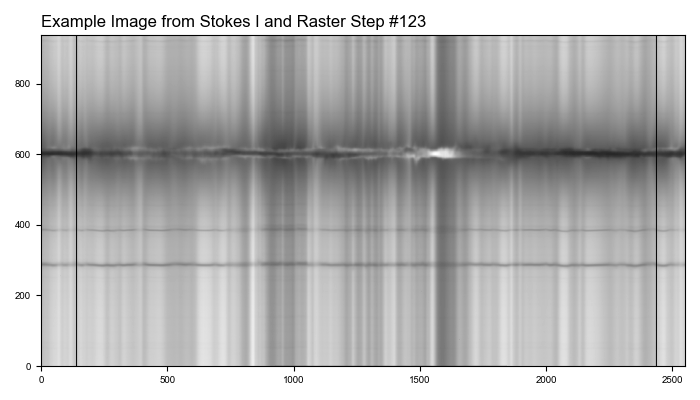

In [98]:
plt.figure(figsize = (7,4))
plt.imshow(stokesI_image,aspect='auto')
plt.title(f"Example Image from Stokes I and Raster Step #{rasterStep}",loc = 'left')
plt.tight_layout()

In [77]:
## Lets compare the time it takes load a small piece of the image at a single wavelength
stks = 0 
with ProgressBar(): 
    stokesI_image = ds.data[stks,:,200,:].compute()

[########################################] | 100% Completed | 11.46 s


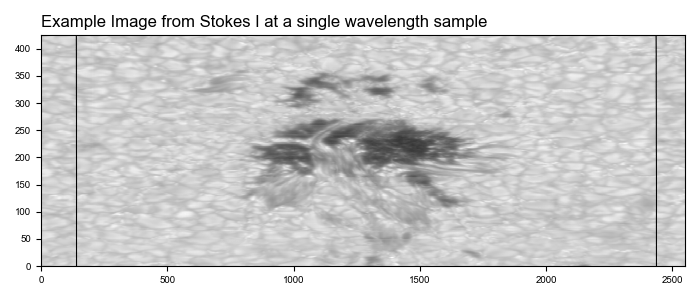

In [78]:
plt.figure(figsize = (7,3))
plt.imshow(stokesI_image,aspect='auto')
plt.title(f"Example Image from Stokes I at a single wavelength sample",loc = 'left')
plt.tight_layout()

## Options for  

In [81]:
ds_crop = ds[0,:100,100:400,:]
ds_crop

This VISP Dataset consists of 100 frames.
Files are stored in /data/tschad/DKIST_Level1/pid_2_114/ALZEL

This calibration has Dataset ID ALZEL.
The unique identifier for the input observe frames (Product ID) is (no ProductID).

This Dataset has 3 pixel and 4 world dimensions.

The data are represented by a <class 'dask.array.core.Array'> object:
dask.array<getitem, shape=(100, 300, 2549), dtype=float32, chunksize=(1, 300, 2549), chunktype=numpy.ndarray>

Array Dim  Axis Name                Data size  Bounds
        0  raster scan step number        100  None
        1  dispersion axis                300  None
        2  spatial along slit            2549  None

World Dim  Axis Name                  Physical Type                   Units
        3  time                       time                            s
        2  helioprojective latitude   custom:pos.helioprojective.lat  arcsec
        1  wavelength                 em.wl                           nm
        0  helioprojective longi

In [48]:
## Create a memmapped array
dask_array = ds.data[0]
filename = "output_memmap.dat"
memmap_array = np.memmap(filename, dtype=dask_array.dtype, mode='w+', shape=dask_array.shape)

## time-consuming step...store the dask array into the memmap
## this will require uncompressing and writing of all the FITS stored data into the memmap
## the memmap_array may end up being quite large
with ProgressBar():
    da.store(ds.data[0], memmap_array)

## link the memmap_array back to the original dataset object
#ds.data = memmap_array

[########################################] | 100% Completed | 124.48 s


In [49]:
memmap_array.shape

(1126, 982, 2555)

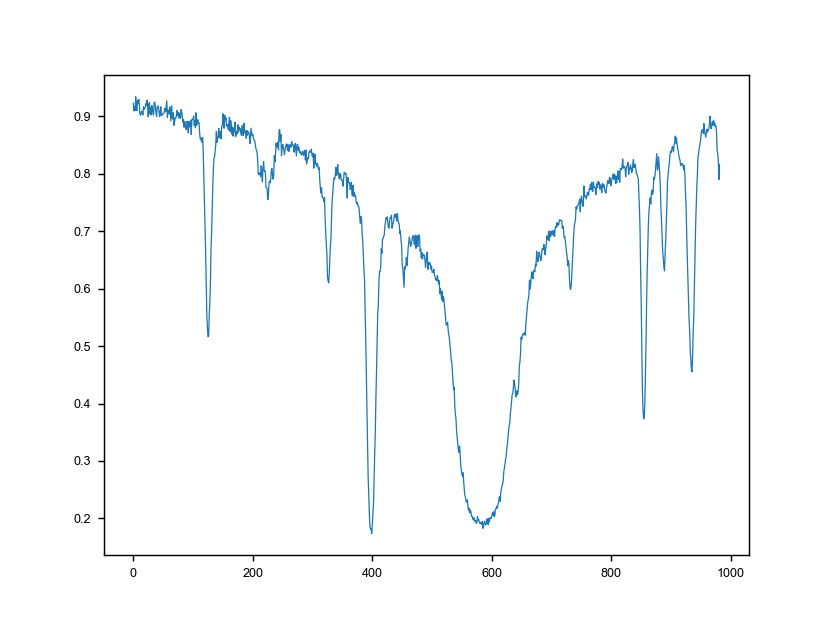

In [50]:
plt.figure()
plt.plot(memmap_array[12,:,1234])

In [66]:
with ProgressBar():
    imgCor = ds.data[:,:,600,:].compute()

[#######                                 ] | 18% Completed | 417.85 s


KeyboardInterrupt



In [68]:
ds.files.filenames

['VISP_2023_06_14T18_30_13_528_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_559_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_589_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_619_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_649_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_679_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_709_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_740_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_770_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_800_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_830_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_860_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_890_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_920_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_951_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_13_981_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06_14T18_30_14_011_00486100_I_AYMZJ_L1.fits',
 'VISP_2023_06

In [ ]:
from astropy.io import fits 
def work(n): 
    f = ds.files.basepath / ds.files.filenames[n]
    return fits.getdata(f,ext=1)[0,600,:]    

ncpus = 40 
p = multiprocessing.Pool(processes=ncpus,maxtasksperchild = 1000)
arg_array = list(range(77694)) 
rs = p.imap(work,arg_array)
p.close()

imgCor = np.zeros((len(arg_array),2555))
pbar = tqdm(total=len(arg_array),position = 0, leave = True)
for i,res in enumerate(rs):
    imgCor[i,:] = res 
    pbar.update()
pbar.close()



 17%|████████████████████████████▌                                                                                                                                           | 13219/77694 [01:20<07:52, 136.38it/s]

In [84]:
len(ds.files.filenames)

77694

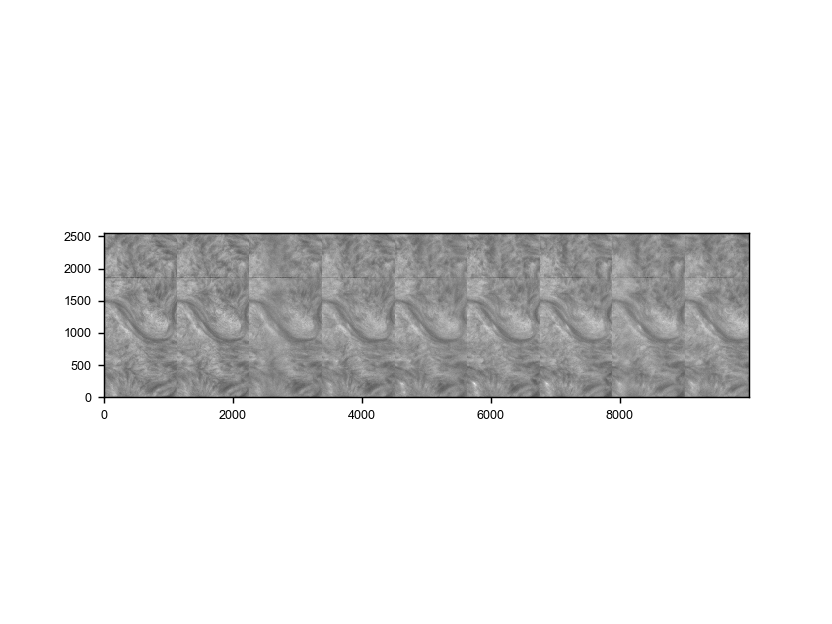

In [90]:
plt.figure()
plt.imshow(imgCor[0:10000,:].T)

In [79]:
f = ds.files.basepath / ds.files.filenames[0]
fits.getdata(f,ext=1)[0,600,:].shape

(2555,)

In [76]:
ds.files.basepath / ds.files.filenames[0]

PosixPath('/data/tschad/DKIST_Level1/pid_2_23/AYMZJ/VISP_2023_06_14T18_30_13_528_00486100_I_AYMZJ_L1.fits')

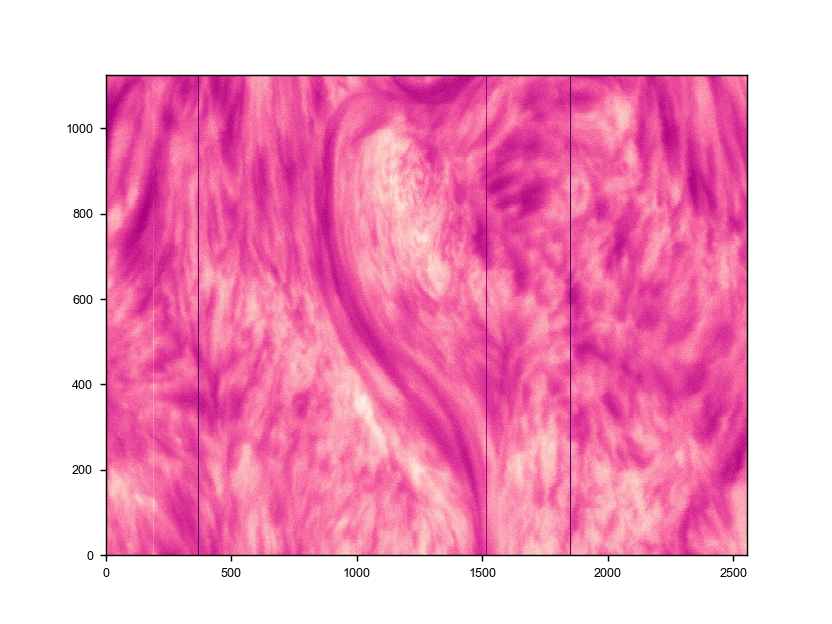

In [65]:
plt.figure()
plt.imshow(memmap_array[:,600,:],norm = PowerNorm(1.7),aspect=1.7,cmap = 'RdPu_r')

In [39]:
ds.data.shape

(214, 143, 937, 2550)

In [40]:
with ProgressBar():
    img = ds.data[:50,:,593,:].compute()

[########################################] | 100% Completed | 200.98 s


In [41]:
img.shape

(50, 143, 2550)

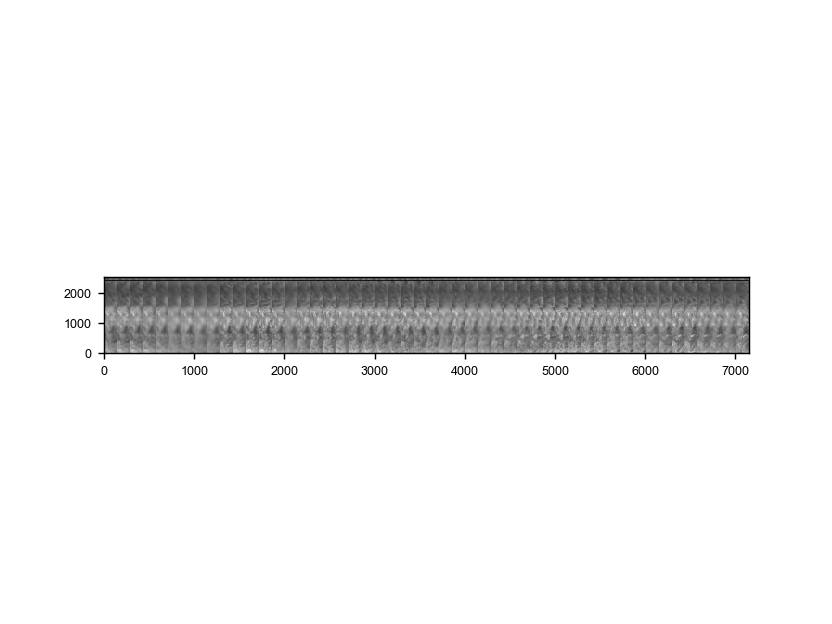

In [42]:
plt.figure()
plt.imshow(img.reshape(50*143,-1).T,aspect=1/3,norm = PowerNorm(0.7))

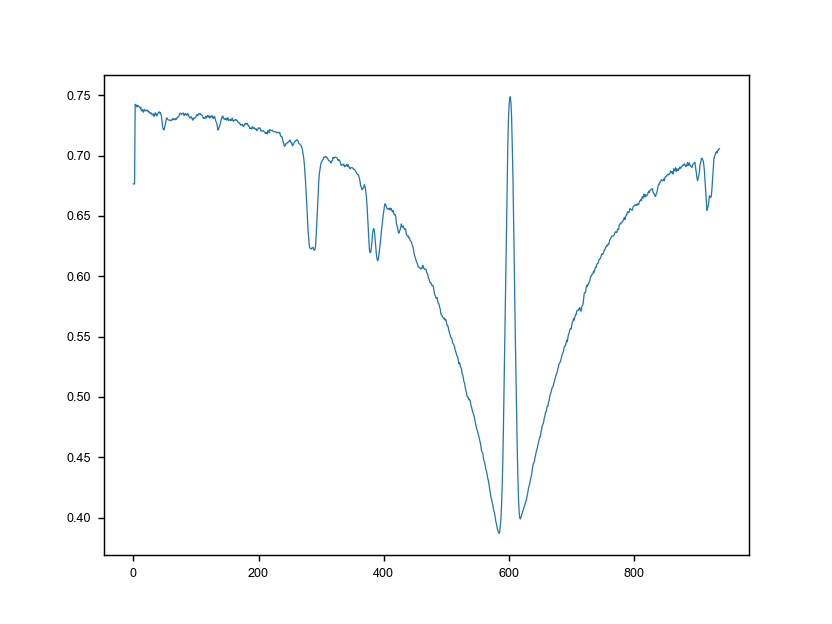

In [9]:
plt.figure()
plt.plot(ds.data[0,234,:,1234])

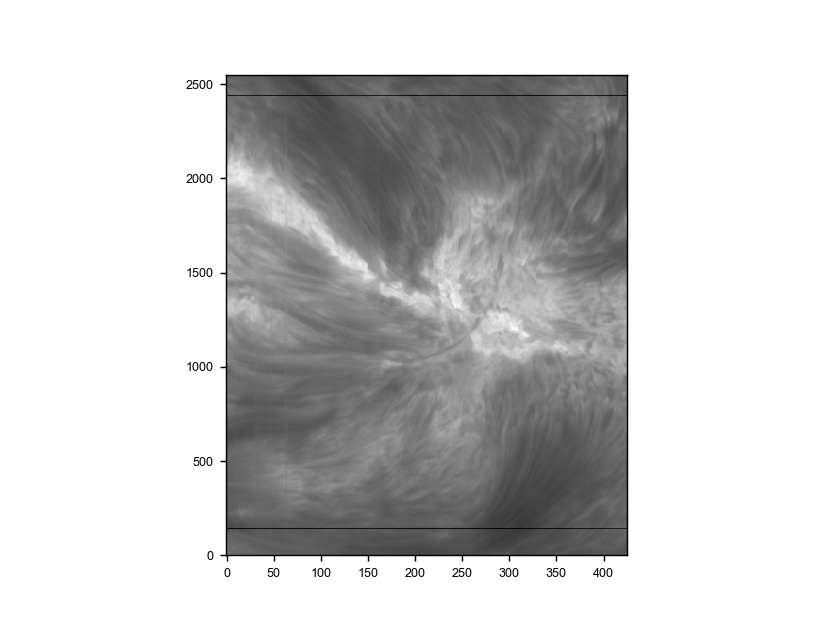

In [17]:
plt.figure()
plt.imshow(ds.data[0,:,600,:].T,aspect=1/5,norm= PowerNorm(0.6))

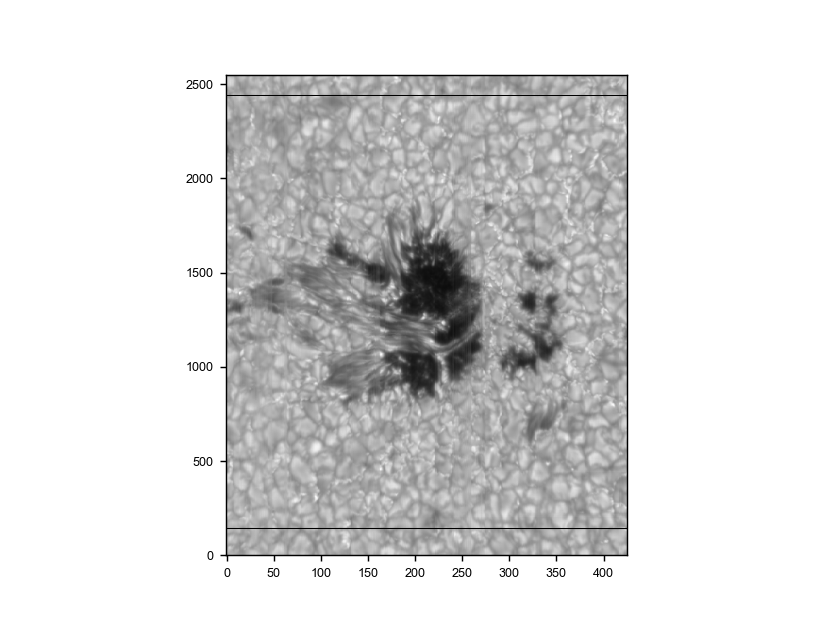

In [11]:
plt.figure()
plt.imshow(ds.data[0,:,300,:].T,aspect=1/5,norm= PowerNorm(2))

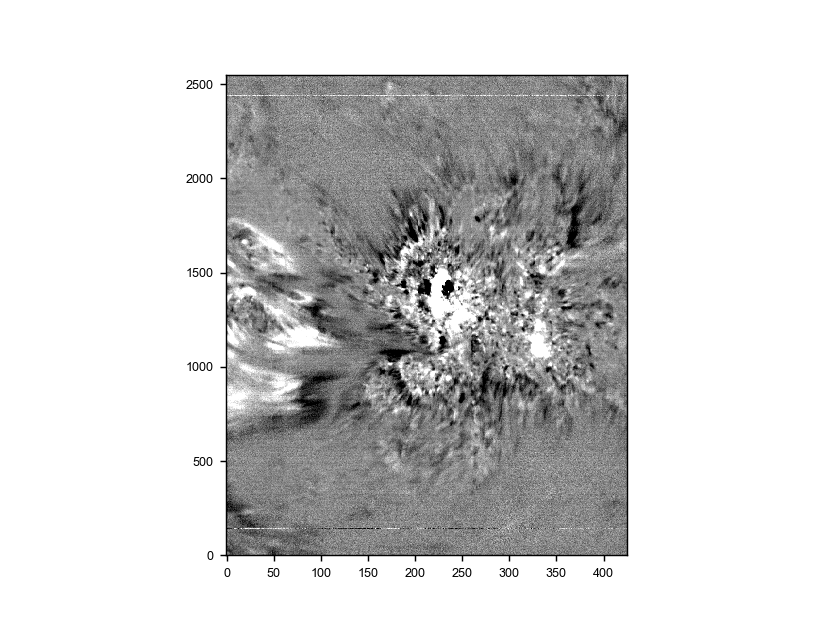

In [12]:
plt.figure()
plt.imshow((ds.data[3,:,600,:]/ds.data[0,:,600,:]).T,aspect=1/5)
plt.clim(-0.02,0.02)

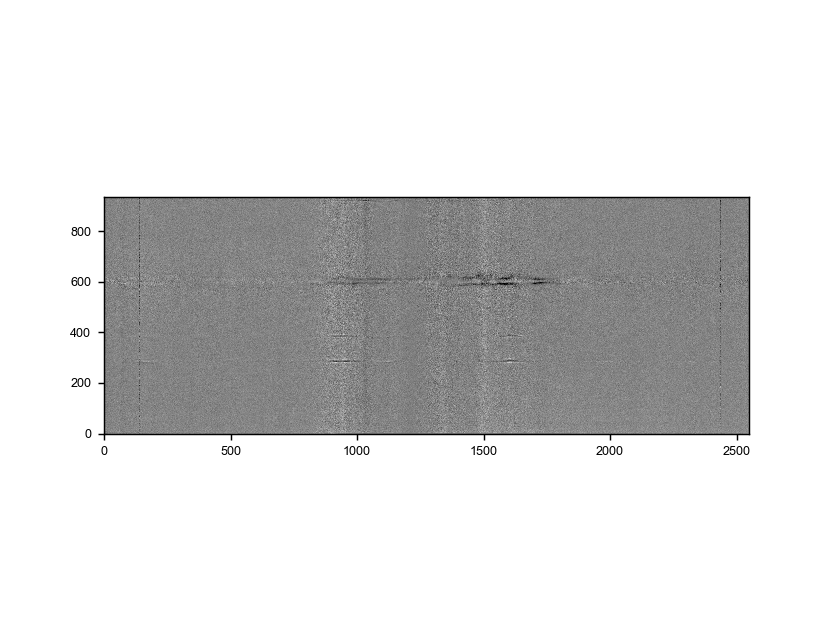

In [13]:
plt.figure()
plt.imshow((ds.data[2,250,:,:]/ds.data[0,200,:,:]) - 0.04*(ds.data[3,250,:,:]/ds.data[0,200,:,:]) )
plt.clim(-0.02,0.02)

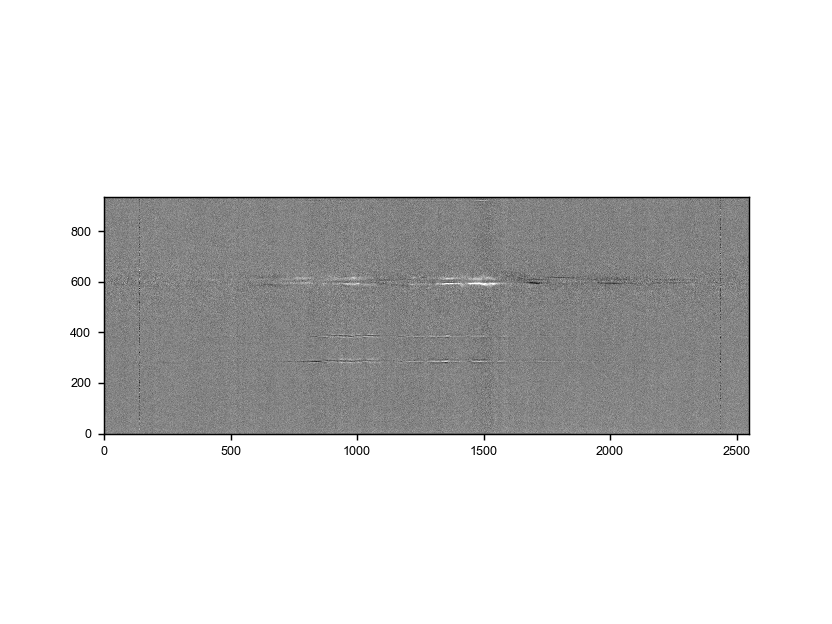

In [18]:
plt.figure()
step = 150
plt.imshow((ds.data[2,step,:,:]/ds.data[0,step,:,:]) - 0.04*(ds.data[3,step,:,:]/ds.data[0,step,:,:]) )
plt.clim(-0.02,0.02)

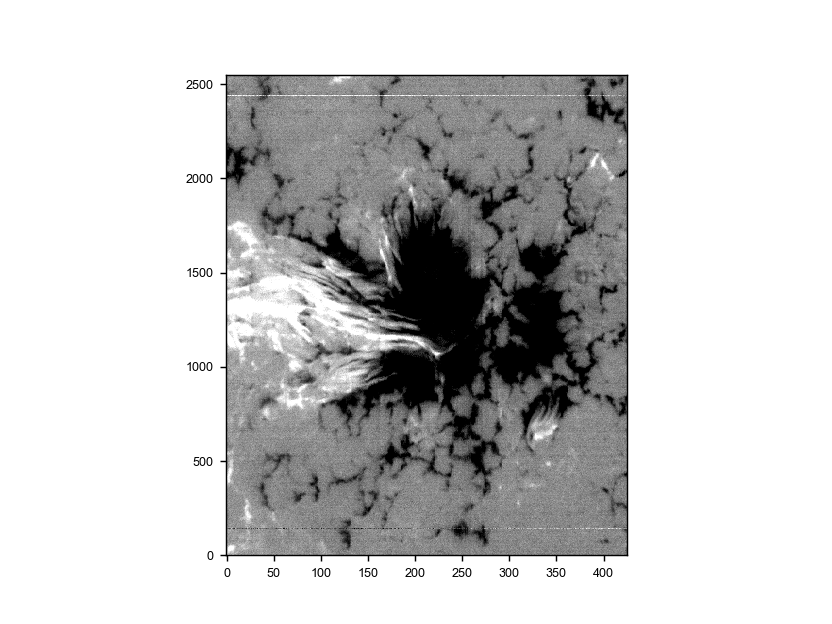

In [15]:
wvi = 381

plt.figure()
plt.imshow((ds.data[3,:,wvi,:]/ds.data[0,:,wvi,:]).T,aspect=1/5)
plt.clim(-0.02,0.02)

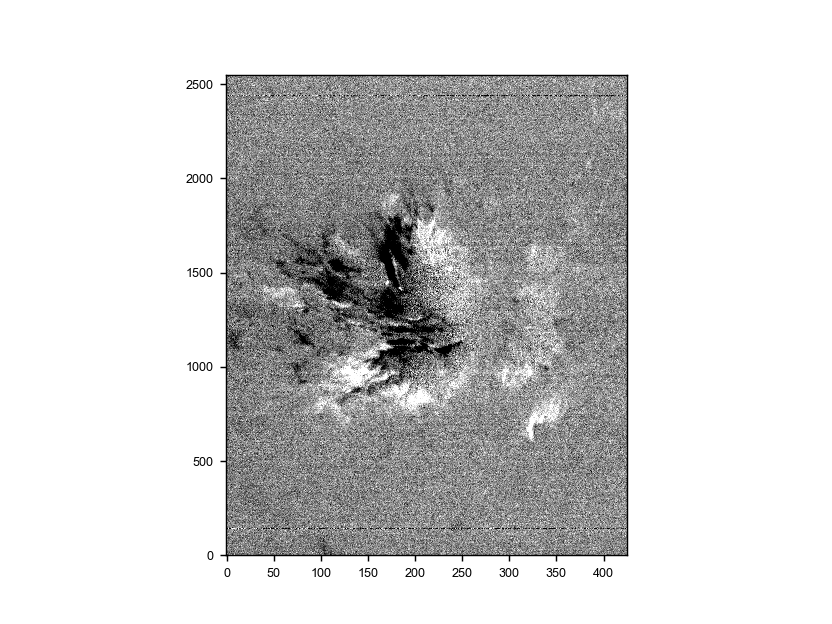

In [19]:
wvi = 379
plt.figure()
plt.imshow((ds.data[2,:,wvi,:]/ds.data[0,:,wvi,:] - 0.07*ds.data[3,:,wvi,:]/ds.data[0,:,wvi,:]).T,aspect=1/5)
plt.clim(-0.005,0.005)